In [1]:
import pickle
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from evaluation_util import plot, evaluate_on_dataset, perf_df

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/lightning_utilities/core/imports.py:14: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources
/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/lightning_fabric/__init__.py:40: Deprecated call to `pkg_resources.declare_namespace('lightning_fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
/home/icb/yuge.ji/miniconda3/envs/pertpy_clean2/lib/python3.10/site-packages/pytorch_lightning/__init__.py:37: Deprecated call to `pkg_resources.declare_namespace('pytorch_lightning')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/r

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
%load_ext autoreload
%autoreload 2

In [294]:
dss_path = '/lustre/scratch/users/yuge.ji/metrics/with_add_metrics_final'

In [295]:
performances = {}

## delete after

In [240]:
import anndata as ad
adata = ad.AnnData(pd.read_csv('data/sim_files/sim_files/splatter_sim/splatter_sim_dropout.csv').T, obs=pd.read_csv('data/sim_files/sim_files/splatter_sim/splatter_sim_obs_dropout.csv'))
from utils import annotate
params = pd.read_csv('data/sim_files/sim_files/splatter_sim/splatter_sim_params_dropout.csv')
annotate(adata, params)

In [241]:
adata.obs.perturbation.value_counts()

perturbation
control    16082
Path23      1042
Path6       1037
Path17      1030
Path18      1027
Path21      1023
Path11      1021
Path2       1019
Path14      1013
Path8       1008
Path15      1006
Path10      1002
Path5        997
Path24       993
Path7        989
Path16       985
Path3        985
Path19       980
Path12       975
Path9        972
Path20       971
Path25       969
Path13       968
Path22       966
Path4        940
Name: count, dtype: int64

In [257]:
from utils import scanpy_setup, sample_and_merge_control_random, subsample, get_pwdf_per_condition, generate

In [ ]:
scanpy_setup(adata)
n = 600
merged = sample_and_merge_control_random(adata, 'control', n=5)

In [244]:
filtered = subsample(merged, n)

In [251]:
subset = generate(300, filtered, min_cells=n)[:, adata.var['highly_variable']]

In [252]:
subset.obs.perturbation.value_counts()

perturbation
Path10      300
Path11      300
Path12      300
Path13      300
Path14      300
Path15      300
Path16      300
Path17      300
Path18      300
Path19      300
Path2       300
Path20      300
Path21      300
Path22      300
Path23      300
Path24      300
Path25      300
Path3       300
Path4       300
Path5       300
Path6       300
Path7       300
Path8       300
Path9       300
control0    300
control1    300
control2    300
control3    300
control4    300
Name: count, dtype: int64

In [256]:
subset

View of AnnData object with n_obs × n_vars = 8700 × 2000
    obs: 'Cell', 'Batch', 'Group', 'ExpLibSize', 'Step', 'group', 'Prob', 'DEProb', 'DownProb', 'FacLoc', 'FacScale', 'Steps', 'Skew', 'log(DEProb)', 'perturbation'
    obsm: 'X_pca'
    layers: 'counts'

In [292]:
collat = get_pwdf_per_condition(subset, ['mmd_rbf'], ['control0'], 'Path10', rep='lognorm')

In [293]:
collat['mmd_rbf-Path10']

perturbation,Path10,Path11,Path12,Path13,Path14,Path15,Path16,Path17,Path18,Path19,...,Path5,Path6,Path7,Path8,Path9,control0,control1,control2,control3,control4
control0,0.006643,0.006804,0.00668,0.00713,0.00667,0.006658,0.006709,0.006887,0.00707,0.008495,...,0.006669,0.006696,0.006872,0.006654,0.006645,0.0,0.00659,0.006595,0.006617,0.006601


In [273]:
subset

AnnData object with n_obs × n_vars = 8700 × 2000
    obs: 'Cell', 'Batch', 'Group', 'ExpLibSize', 'Step', 'group', 'Prob', 'DEProb', 'DownProb', 'FacLoc', 'FacScale', 'Steps', 'Skew', 'log(DEProb)', 'perturbation'
    obsm: 'X_pca'
    layers: 'counts', 'lognorm'

In [289]:
distance = pt.tools.Distance(metric='mmd', layer_key='lognorm')
distance.onesided_distances(subset, 'perturbation', selected_group='control0', groups=None, kernel='rbf')

running distance mmd
selected_group control0
groups None
running this distance with kwargs: {'kernel': 'rbf'}


Output()

perturbation
Path10      0.006643
Path11      0.006804
Path12      0.006680
Path13      0.007130
Path14      0.006670
Path15      0.006658
Path16      0.006709
Path17      0.006887
Path18      0.007070
Path19      0.008495
Path2       0.006650
Path20      0.006673
Path21      0.006653
Path22      0.006648
Path23      0.007187
Path24      0.007620
Path25      0.011943
Path3       0.006653
Path4       0.006649
Path5       0.006669
Path6       0.006696
Path7       0.006872
Path8       0.006654
Path9       0.006645
control0    0.000000
control1    0.006590
control2    0.006595
control3    0.006617
control4    0.006601
Name: mmd to control0, dtype: float64

In [ ]:
distance = pt.tools.Distance(metric='mmd')
distance.onesided_distances(adata, 'perturbation', selected_group='control', groups=None, kernel='rbf')

In [ ]:
distance = pt.tools.Distance(metric='mmd')
distance.onesided_distances(adata, 'perturbation', selected_group='control', groups=None)

## simulated

In [296]:
%%time
# with open('metric_runs_simulated2.pkl', 'rb') as file:
#     results = pickle.load(file)
# print(results.keys())
with open(f'{dss_path}/sim_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 40.5 ms, sys: 2.17 s, total: 2.21 s
Wall time: 3.77 s


In [297]:
# get metadata
sim_path = './data/sim_files/sim_files/splatter_sim'
params = pd.read_csv(f'{sim_path}/splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df):
    # annotate
    for col in params.columns:
        df[col] = df['perturbation'].map(dict(zip(params.perturbation, params[col])))
    df = df.dropna()  # dropping fake controls

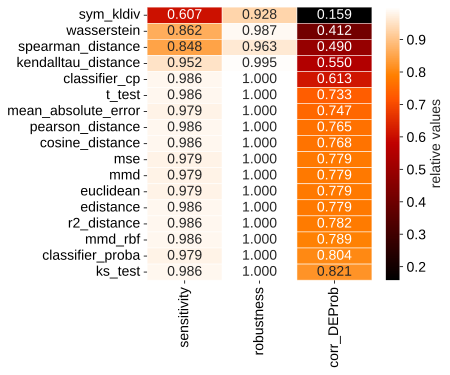

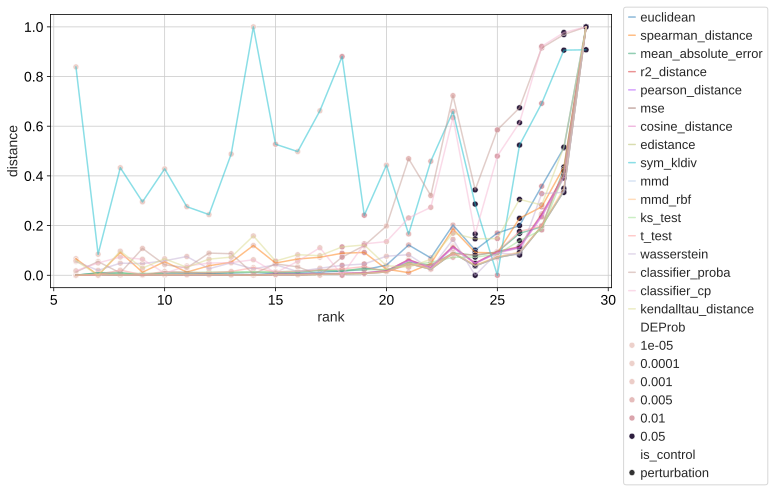

In [298]:
performances['simulated'] = evaluate_on_dataset(results, annotate, 'DEProb', 'ks_test')

## garcia

In [299]:
%%time
with open(f'{dss_path}/garcia_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 20.6 ms, sys: 445 ms, total: 465 ms
Wall time: 799 ms


In [300]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['pcw'] = [float(p) if 'control' not in p else 8.6 for p in df.perturbation]

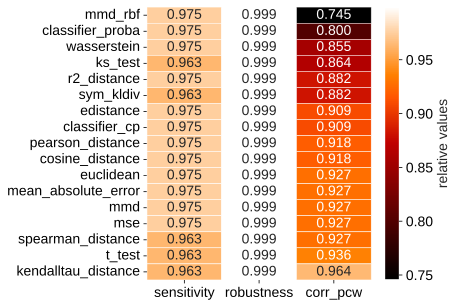

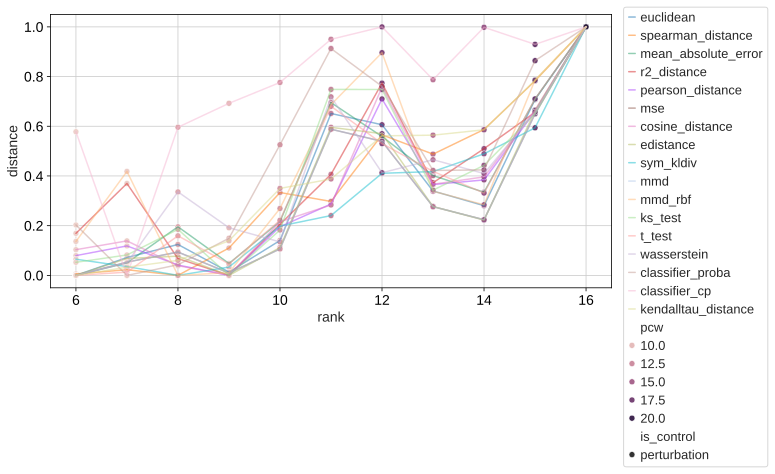

In [301]:
performances['garcia'] = evaluate_on_dataset(results, annotate, 'pcw', 'kendalltau_distance')

## schiebinger

In [302]:
%%time
with open(f'{dss_path}/schiebinger_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 29.7 ms, sys: 1.53 s, total: 1.56 s
Wall time: 2.06 s


In [303]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['day'] = [float(p[1:]) if 'D' in p else 0 for p in df.perturbation]

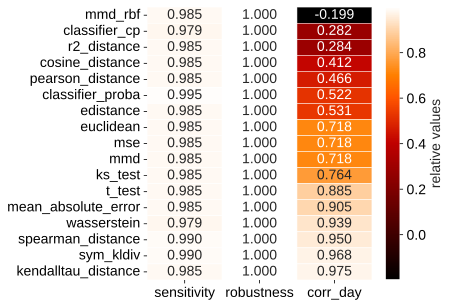

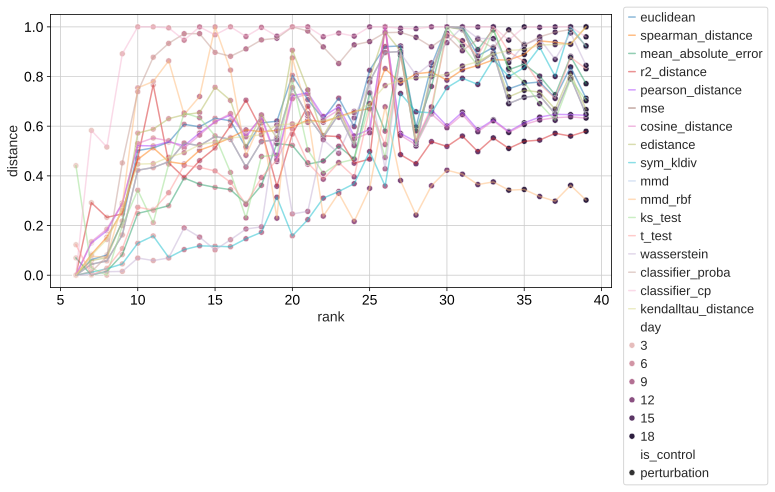

In [304]:
performances['schiebinger'] = evaluate_on_dataset(results, annotate, 'day', 'kendalltau_distance')

## satinha

In [305]:
%%time
with open(f'{dss_path}/satinha_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 34.5 ms, sys: 1.23 s, total: 1.27 s
Wall time: 1.83 s


Don't think we have a source of ground truth in this dataset...

In [306]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = 1

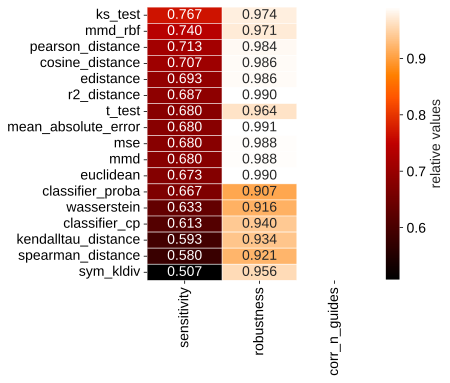

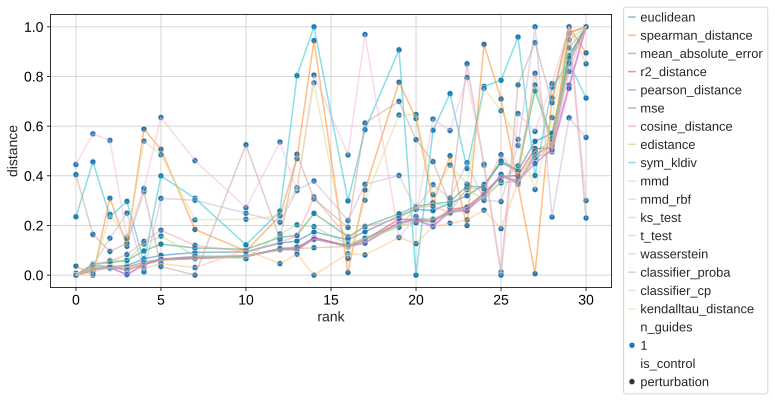

In [307]:
performances['satinha'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## norman

In [308]:
%%time
with open(f'{dss_path}/norman_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 46.2 ms, sys: 6.52 s, total: 6.57 s
Wall time: 11 s


In [309]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = [int(s.count('+'))+1 for s in df.perturbation]

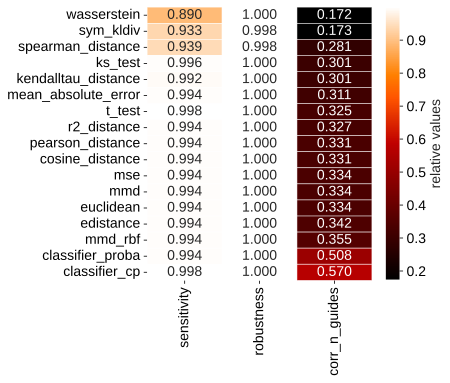

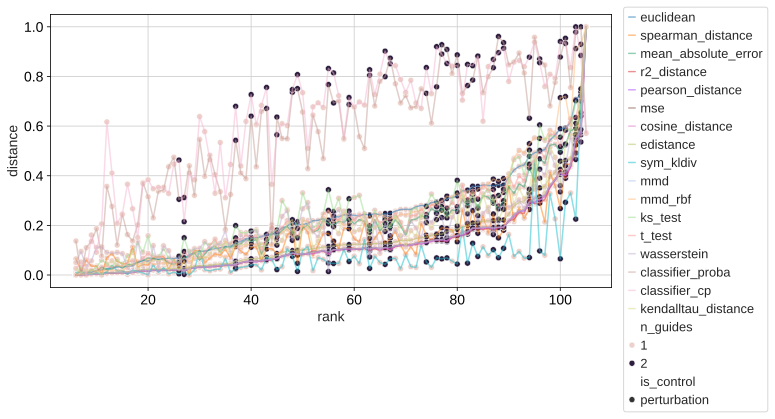

In [310]:
performances['norman'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## sciplex

In [311]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

### MCF7

In [312]:
%%time
with open(f'{dss_path}/spMCF7_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 33 ms, sys: 5.62 s, total: 5.65 s
Wall time: 7.07 s


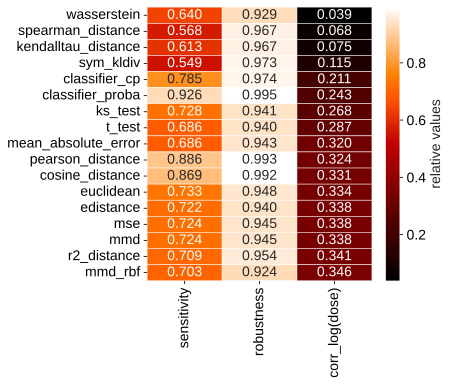

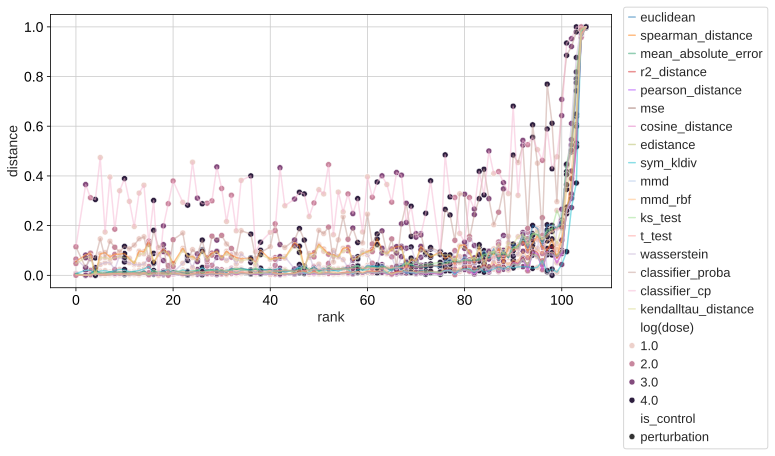

In [313]:
performances['sciplex_MCF7'] = evaluate_on_dataset(results, annotate, 'log(dose)', 't_test')

### A549

In [314]:
%%time
with open(f'{dss_path}/spA549_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 28.6 ms, sys: 2.04 s, total: 2.07 s
Wall time: 2.67 s


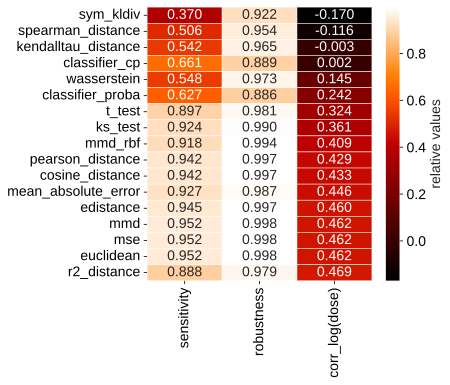

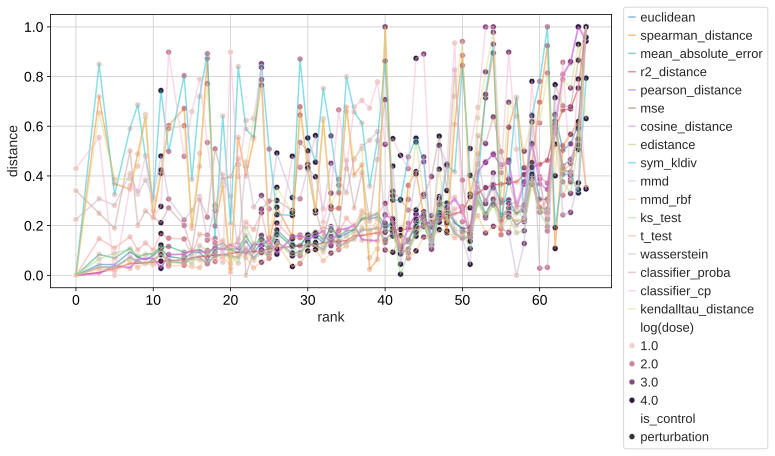

In [315]:
performances['sciplex_A549'] = evaluate_on_dataset(results, annotate, 'log(dose)', 'r2_distance')

### K562

In [316]:
%%time
with open(f'{dss_path}/spK562_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 49.7 ms, sys: 5.02 s, total: 5.07 s
Wall time: 7.28 s


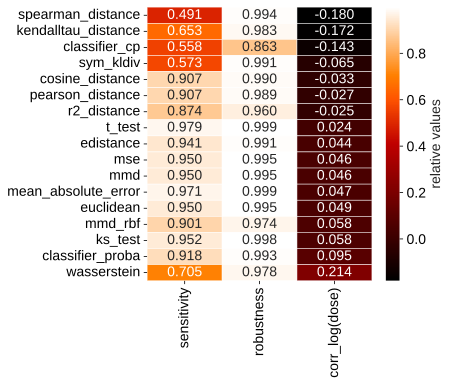

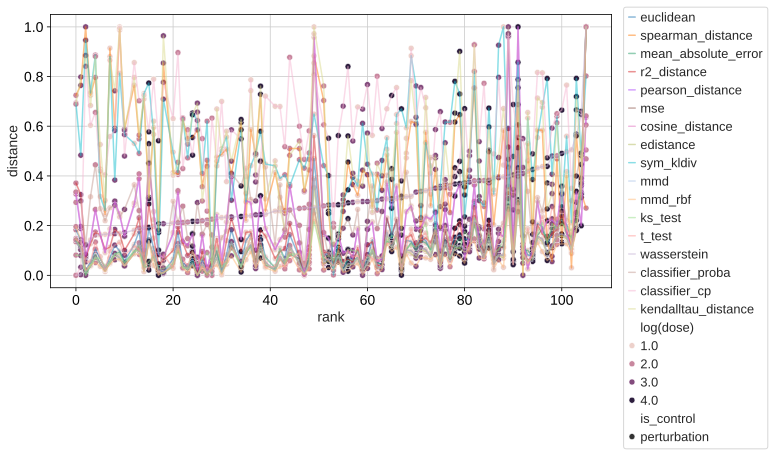

In [317]:
performances['sciplex_K562']  = evaluate_on_dataset(results, annotate, 'log(dose)', 'wasserstein')

## tahoe

In [318]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

### A549

In [319]:
%%time
with open(f'{dss_path}/tahoe_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 33.7 ms, sys: 6.45 s, total: 6.48 s
Wall time: 8.79 s


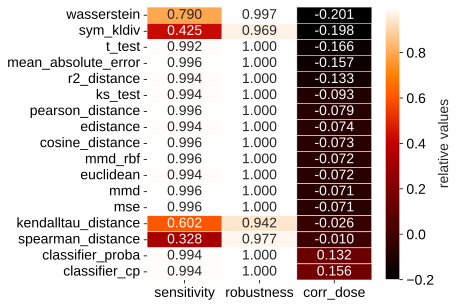

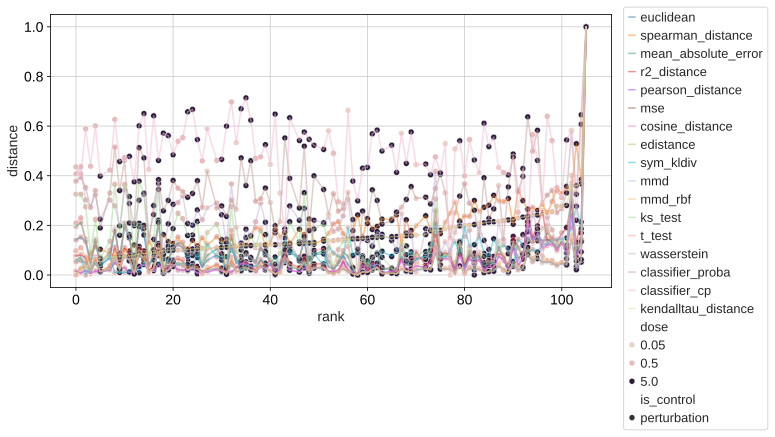

In [320]:
performances['tahoeA549'] = evaluate_on_dataset(results, annotate, 'dose', 'kendalltau_distance')

### HT29

In [321]:
%%time
with open(f'{dss_path}/tahoeHT29_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 65.8 ms, sys: 6.27 s, total: 6.34 s
Wall time: 9.03 s


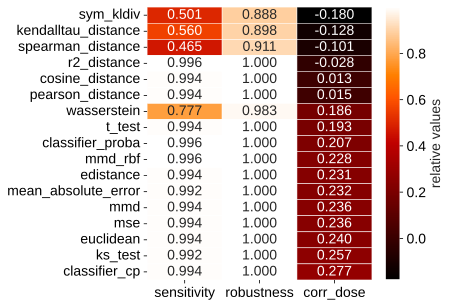

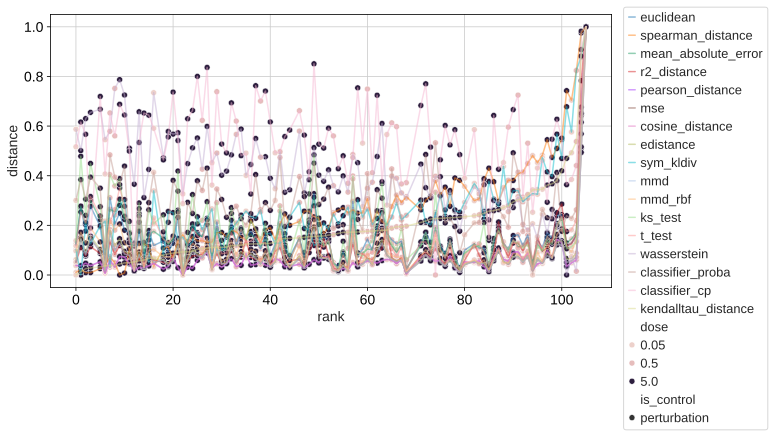

In [322]:
performances['tahoeHT29'] = evaluate_on_dataset(results, annotate, 'dose', 'kendalltau_distance')

### BT474

In [323]:
%%time
with open(f'{dss_path}/tahoeBT474_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 37.4 ms, sys: 462 ms, total: 499 ms
Wall time: 1.72 s


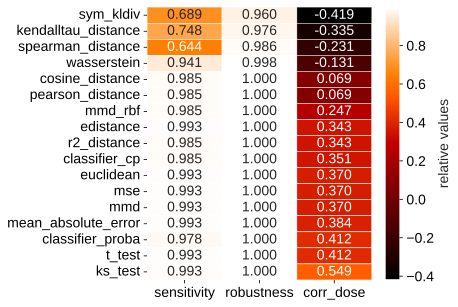

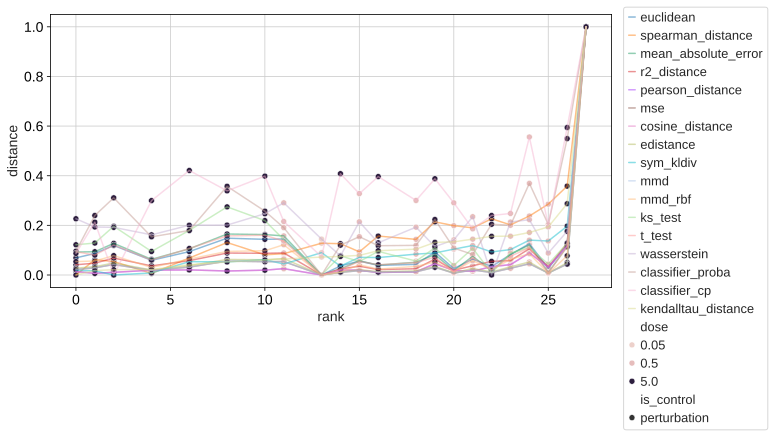

In [324]:
performances['tahoeBT474'] = evaluate_on_dataset(results, annotate, 'dose', 'kendalltau_distance')

## mcfarland

In [325]:
%%time
with open(f'{dss_path}/mcfarland_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 23.5 ms, sys: 59 ms, total: 82.5 ms
Wall time: 321 ms


In [326]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['time'] = [0 if 'control' in p else p.split('_')[1] for p in df.perturbation]

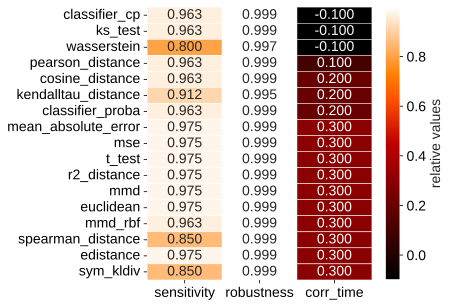

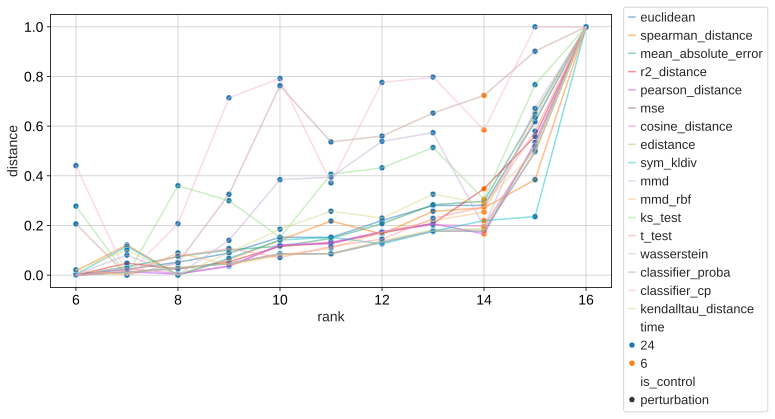

In [327]:
performances['mcfarland'] = evaluate_on_dataset(results, annotate, 'time', 'mean_absolute_error')

## summary

In [328]:
dfs = []
for k, df in performances.items():
    sdf = df.add_suffix(f'_{k}')
    dfs.append(sdf)

In [329]:
df = pd.concat(dfs, axis=1)

Drop any columns that are completely empty because evaluation wasn't possible.

In [330]:
df = df.dropna(axis=1, how='all')

Rename the distance metrics for consistency for publication.

In [331]:
df.index = [' '.join(x.split('_')) for x in df.index]
df = df.rename({
    'euclidean':'Euclidean',
    'mse':'MSE',
    'mmd':'MMD linear',
    'mmd rbf': 'MMD RBF',
    'edistance':'E-distance',
    'pearson distance': 'Pearson',
    't test': 'T-test',
    'r2 distance': 'R2',
    'ks test': 'KS statistic',
    'kendalltau distance': 'Kendall tau distance',
    'spearman distance': 'Spearman',
    'classifier cp': 'classifier class projection',
    'wasserstein':'Wasserstein',
    'sym kldiv':'symmetric KL div.'
})

Many of the plots will use scaled values. Also calculate the final ranking using the avg.

In [332]:
ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
ndf.mean(axis=1)

Euclidean                      0.830402
MMD linear                     0.828234
MSE                            0.828234
classifier proba               0.817474
E-distance                     0.817123
mean absolute error            0.815886
cosine distance                0.805949
Pearson                        0.801066
R2                             0.766932
T-test                         0.762901
MMD RBF                        0.755817
KS statistic                   0.755690
classifier class projection    0.684003
Wasserstein                    0.519165
Kendall tau distance           0.427435
Spearman                       0.369893
symmetric KL div.              0.271254
dtype: float64

Standardize the order of the dataframe and save.

In [333]:
df = df.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
df.to_csv('./figures/results_table_final.csv')

## Plot final table

In [ ]:
sc.set_figure_params(dpi=100, frameon=False, facecolor=None, transparent=True, ipython_format='svg', vector_friendly=False)
plt.rcParams['svg.fonttype'] = 'none'

In [ ]:
df = pd.read_csv('./figures/results_table_final.csv', index_col=0)  # old one was in just plain `results_table`
ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
original_df = df.copy()  # use this only to get the original column names

In [ ]:
types = {
    'E-distance':'Ia',
    'Euclidean':'Ia',
    'KS statistic':'Ia',
    'Kendall tau distance':'III',
    'MMD linear':'Ia',
    'MSE':'Ia',
    'Pearson':'II',
    'R2':'II',
    'Spearman':'III',
    'T-test':'Ib',
    'Wasserstein':'III',
    'classifier class projection':'-',
    'classifier proba':'-',
    'MMD RBF':'II',
    'cosine distance':'II',
    'mean absolute error':'Ib',
    'symmetric KL div.':'III',
}

type_to_rank = {
    'Ia': 1,
    'Ib': 2,
    'II': 3,
    'III': 4,
}

color_dict = {
    'simulated':'grey',
    'garcia':'orange',
    'schiebinger':'salmon',
    'satinha':'yellowgreen',
    'norman':'darkgreen',
    'MCF7':'lightblue',
    'A549':'steelblue',
    'K562':'blue',
    'tahoeA549':'lavender',
    'tahoeHT29':'purple',
    'tahoeBT474':'mediumorchid',
    'mcfarland':'darkblue',
}

trio = ['indianred', 'darkseagreen', 'thistle']
cmap = 'bone'
bar_color = 'lightslategrey'

def xtick_off(ax):
    ax.set_xticklabels([])
    ax.set_xticks([])

def ytick_off(ax):
    ax.set_yticklabels([])
    ax.set_yticks([])
    
def add_type(df):
    df['type'] = df.index.map(types)
    return df

def plt_bar(df, title=None, cmap='twilight'):
    plt.figure(facecolor='none')
    sns.barplot(x=df.index, y=0, hue="type", data=df, palette=cmap, dodge=False)
    plt.gca().axis('off')
    plt.grid(None)
    plt.title(title)

In [ ]:
main_plot_df = df.copy()
main_plot_df = main_plot_df.fillna(0)

plt.figure(figsize=(24, 6))
# just for the col color
col_color_dataset = [color_dict[c.split('_')[-1]] for c in df.columns]
col_color_task = trio*3 + trio[:2] + trio*8
sns.clustermap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".")),
    cmap=cmap, fmt = '', cbar_kws={'label': 'Rank within column'},
    row_cluster=False, col_cluster=False, col_colors=[col_color_dataset, col_color_task],
    cbar_pos=None
)
plt.savefig('./figures/mainfig_labelbar.svg')

# processing
main_plot_df.columns = ['_'.join(c.split('_')[:2]) for c in main_plot_df.columns]
main_plot_df = main_plot_df.rename(columns={'rank_mean':'CRP', 'rank_var*100':'robustness'})
halfway = 8
rank_df = main_plot_df.round(3).rank(method='max').clip(lower=halfway)

order = ['MSE', 'MMD linear', 'Euclidean', 'E-distance', 'KS statistic',  # type I
    'mean absolute error', 'T-test',  # Ib
    'cosine distance', 'Pearson', 'R2', 'MMD RBF',  # II
    'classifier proba', 'classifier class projection',  # II - classification
    'Wasserstein', 'Kendall tau distance', 'Spearman', 'symmetric KL div.',   # III
]

# getting order automatically
# bar_df = add_type(pd.DataFrame((rank_df > 8).sum(axis=1)))
# bar_df['rank'] = bar_df.type.map(type_to_rank)
# order = bar_df.sort_values(by='rank').index

main_plot_df = main_plot_df.loc[order]
rank_df = rank_df.loc[order]

# the actual plot
plt.figure(figsize=(24, 6))
ax = sns.heatmap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1")),
    cmap=cmap, linewidths=.2, fmt = '',
    cbar_kws={'label': 'Rank within column'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.savefig('./figures/mainfig_table.svg')
plt.show()

# just for the colorbar
plt.figure(figsize=(8, 6))
ax = sns.heatmap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1")),
    cmap=f'{cmap}_r', linewidths=.2, fmt = '',
    cbar_kws={'label': 'Rank within column', 'orientation': 'horizontal', 'location': 'bottom'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.savefig('./figures/mainfig_colorbar.svg')
plt.show()

# for the plot showing that MSE performs above average in all datasets
plt.figure(figsize=(24, 6))
ax = sns.heatmap(
    rank_df.replace(halfway, 0),
    cmap=cmap, cbar_kws={'label': 'Rank within column'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.savefig('./figures/mainfig_table_numberless.svg')
plt.show()

# pairs with the one without numbers
plt_bar(add_type(pd.DataFrame((rank_df > 8).sum(axis=1)).loc[order]), "N ranks above median")
plt.legend(bbox_to_anchor=(1.01, 1.05), ncol=5)
plt.savefig('./figures/mainfig_nranks_sidebar.svg')
plt.show()

# pairs with the one with numbers
plt_bar(add_type(pd.DataFrame(ndf.mean(axis=1)).loc[order]), "average metric score")
plt.legend([], bbox_to_anchor=(1.01, 1.05))
plt.savefig('./figures/mainfig_avgscore_sidebar.svg')
plt.show()

Make the legend

In [ ]:
import matplotlib.patches as mpatches
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(trio, ['CRP', 'robustness', 'BioRep'])]

plt.legend(handles=patches, ncol=3, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
plt.savefig('./figures/mainfig_legend.svg')
plt.show()

In [ ]:
def plot_sub(sub_df, cmap):
    sub_df = sub_df.loc[order]
    sub_df.columns = [c.split('_')[-1] for c in sub_df.columns]
    annot_df = sub_df.fillna(0)
    annot_df = annot_df.applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1"))
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        sub_df.round(3).rank(method='max'),
        annot=annot_df,
        cmap=cmap, linewidths=.5, fmt = '', cbar_kws={'label': 'Rank within column'}
    )
    plt.xticks(rotation=30, ha='right')
    plt.grid(None)
    plt.savefig(f'./figures/supp1_subres_{cmap}.svg')
    plt.show()
    
    bar_df = pd.DataFrame(sub_df.mean(axis=1))
    bar_df = add_type(bar_df)
    plt_bar(bar_df)
    plt.legend([], bbox_to_anchor=(1.01, 1.05))
    plt.ylim(.26)
    plt.savefig(f'./figures/supp1_subresbar_{cmap}.svg')
    plt.show()

    print(sub_df.mean())
    print('mean all:', sub_df.mean().mean())
    return sub_df

In [ ]:
# for a dataset-averaged plot
sub_dfs = []

cols = [c for c in ndf.columns if 'sensitivity' in c]
sub_df = plot_sub(ndf[cols], 'BuPu_r')
sub_dfs.append(sub_df)
print('average:', sub_df.mean().mean())
print('std:', sub_df.values.flatten().std())

In [ ]:
cols = [c for c in ndf.columns if 'robustness' in c]
sub_df = plot_sub(ndf[cols], 'RdPu_r')
sub_dfs.append(sub_df)
print('average:', sub_df.mean().mean())
print('std:', np.nanstd(sub_df.values.flatten()))

In [ ]:
cols = [c for c in ndf.columns if 'sens' not in c and 'robu' not in c]
sub = ndf[cols]
sub.columns = ['_'.join(c.split('_')[:-1]) for c in sub.columns]
sub_df = plot_sub(sub, 'YlGn_r')
sub_dfs.append(sub_df)
print('average:', sub_df.mean().mean())
print('std:', sub_df.values.flatten().std())

Summarized across datasets, per evaluation measure:

In [564]:
def per_eval_pointplot(df, figsize=(4, 6)):
    df = df.round(3)
    df = df.reset_index(names='distance').melt(id_vars='distance', var_name='criterion', value_name='score')

    plt.figure(figsize=figsize)
    sns.pointplot(
        data=df,
        x="score",
        y="distance",
        hue="criterion",
        hue_order=['PDR', 'Robustness', 'BioRep'],
        join=False,
        markers=['o', 's', 'D'],
        markerfacecolor='none',
    )
    plt.xlabel('z-normalized per evaluation measure score')

In [ ]:
summary_df = pd.concat([df.mean(axis=1) for df in sub_dfs], axis=1).set_axis(['PDR', 'Robustness', 'BioRep'], axis=1)
summary_df = summary_df.round(3)
df = (summary_df - summary_df.mean()) / summary_df.std(ddof=0)

per_eval_pointplot(df, figsize=(6, 6))
plt.title('All datasets')
plt.savefig('./figures/mainfig_dotplot.svg')

Summarized across types:

In [ ]:
dataset_types = {
    'simulated':'simulated',
    'garcia':'time course',
    'schiebinger':'time course',
    'satinha':'CRISPR',
    'norman':'CRISPR',
    'MCF7':'small molecule',
    'A549':'small molecule',
    'K562':'small molecule',
    'tahoeA549':'small molecule',
    'tahoeHT29':'small molecule',
    'tahoeBT474':'small molecule',
    'mcfarland':'small molecule',
}

rounded_df = main_plot_df.round(3).copy()
summary_df = (rounded_df - rounded_df.mean()) / rounded_df.std(ddof=0)
summary_df = summary_df.fillna(0)  # if all values were the same, set to the center at 0
summary_df.columns = original_df.columns.copy()  # reset the column names so they have the dataset name in them
summary_df = summary_df.round(3)  # matches above visual

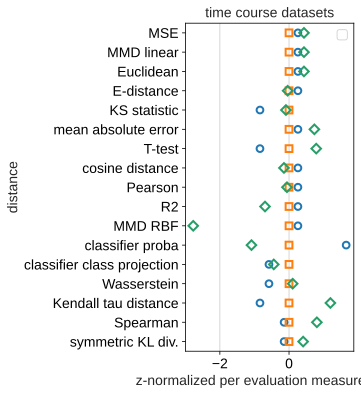

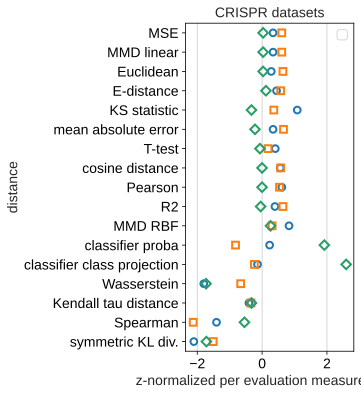

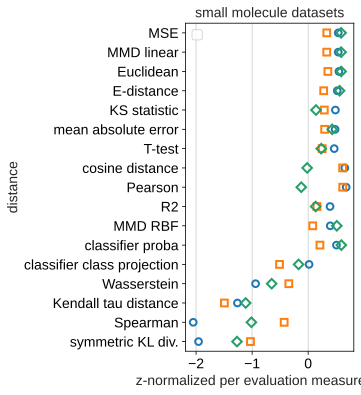

In [566]:
for mode in ['time course', 'CRISPR', 'small molecule']:
    df = summary_df.loc[:,
        summary_df.columns.str.split('_').str[-1].map(dataset_types) == mode
    ]
    df = df.groupby(df.columns.str.split('_').str[0], axis=1).mean()
    df.columns = df.columns.map({'corr':'BioRep', 'robustness':'Robustness', 'sensitivity':'PDR'})

    per_eval_pointplot(df, figsize=(3, 6))
    plt.legend('')
    plt.title(f'{mode} datasets')
    plt.savefig(f'./figures/pointplot_{mode}.svg')

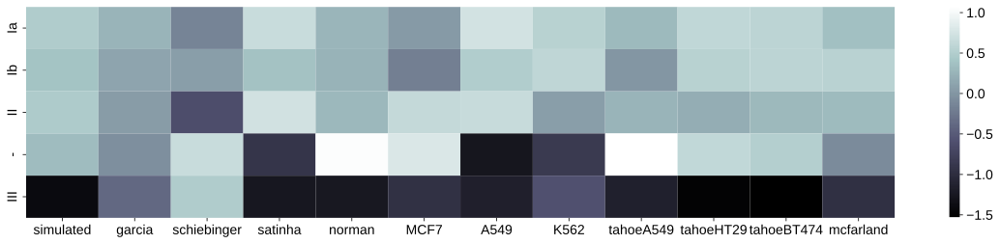

In [442]:
# adjust plotting order (unused)
df = df.reindex(['Ia', 'Ib', 'II', '-', 'III'])
df = df.reindex(list(color_dict.keys()), axis=1)

plt.figure(figsize=(20, 4))
ax = sns.heatmap(df, cmap=cmap)
# xtick_off(ax)
plt.grid(None)

## cluster metrics based on performance

In [398]:
import anndata as ad

In [399]:
types_pca = {
    'E-distance':'ia',
    'Euclidean':'ia',
    'KS statistic':'ia',
    'Kendall tau distance':'iii',
    'MMD linear':'ia',
    'MMD RBF':'ii',
    'MSE':'ia',
    'Pearson':'ii',
    'R2':'ii',
    'cosine distance':'ii',
    'classifier proba':'ii',
    'Spearman':'iii',
    'T-test':'ib',
    'Wasserstein':'iii',
    'classifier class projection':'ii',
    'mean absolute error':'ib',
    'symmetric KL div.':'iii',
}

In [400]:
perf = ad.AnnData(main_plot_df)
perf.obs['method'] = main_plot_df.index.astype('category')
perf.obs['type'] = perf.obs.method.map(types_pca)
perf

AnnData object with n_obs × n_vars = 17 × 35
    obs: 'method', 'type'

In [401]:
sc.tl.pca(perf)
perf.obsm['X_pca'][:, 0] += np.random.normal(0, 0.01, perf.shape[0])  # Add jitter to the first component
perf.obsm['X_pca'][:, 1] += np.random.normal(0, 0.01, perf.shape[0])  # Add jitter to the second component

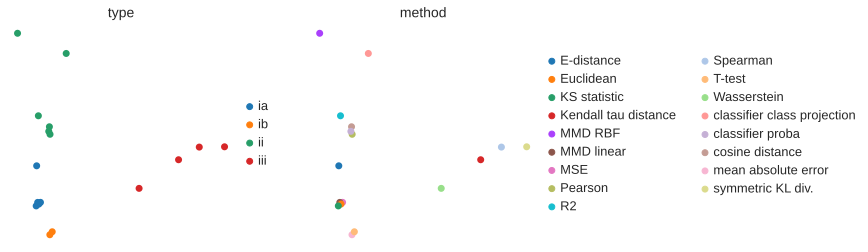

In [402]:
sc.pl.pca(perf, color=['type', 'method'], size=200, show=False)
plt.savefig('./figures/metric_pca.svg')